In [1]:
import glob
import matplotlib.image as mpimg
import imageio as im
from tensorflow.keras import models
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.losses import sparse_categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Conv2D, Flatten, Dense, MaxPool2D
import numpy as np
from tensorflow.python.keras.preprocessing import image
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Model
%matplotlib inline
import tensorflow as tf
print(tf.__version__)
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

2.2.0


In [4]:
def plot_CNN_image_layers(input_image_path):

    # Import image

    img = image.load_img(input_image_path, target_size=(128, 128))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    plt.imshow(img_tensor[0])
    plt.show()

    print(img_tensor.shape)
    
    # Import CNN Model
    
    CNNDetectionmodel = load_model('models/CNNmodel_16_3.h5')

#     # Predict Image

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    classes = CNNDetectionmodel.predict(images, batch_size=1)
    percentage = CNNDetectionmodel.predict(img_tensor, batch_size=1)

    print("0 is Fake, 1 is Real")
    print("Predicted class is:",classes)
    print("Percentage confidence:", percentage)

    # Extract image layers

    # Extracts the outputs of the top 9 layers
    layer_outputs = [layer.output for layer in CNNDetectionmodel.layers[:9]]

    # Creates a model that will return these outputs, given the model input
    activation_model = models.Model(inputs=CNNDetectionmodel.input, outputs=layer_outputs) 

    # Returns a list of five Numpy arrays: one array per layer activation
    activations = activation_model.predict(img_tensor) 

    first_layer_activation = activations[0]
    print(first_layer_activation.shape)

    # Plot image layers

    layer_names = []
    for layer in CNNDetectionmodel.layers[:6]:
        layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot

    images_per_row = 16

    for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
        n_features = layer_activation.shape[-1] # Number of features in the feature map
        size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
        n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        for col in range(n_cols): # Tiles each filter into a big horizontal grid
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                :, :,
                                                col * images_per_row + row]
                channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, # Displays the grid
                            row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                                scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [31]:
def plot_CNN_image_layers_with_model(input_image_path, model_to_test, name_model, dataset_name):

    # Import image

    img = image.load_img(img_path, target_size=(128, 128))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    plt.imshow(img_tensor[0])
    plt.title("Input Image")
    plt.show()

    print(img_tensor.shape)

    # Import model
    
    model_to_test.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    
    # Predict Image

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    
    
    result_batch = model_to_test.predict(img_tensor)
    result_batch_classes = (model_to_test.predict(images, batch_size = 1) > 0.5).astype("int32")
    
    
    print("0 is Fake, 1 is Real")
    print("Predicted class is:",result_batch_classes)
    print("Percentage Confidence:", result_batch)

    # Extract image layers
    
    layer_outputs = [layer.output for layer in model_to_test.layers]

    # Creates a model that will return these outputs, given the model input
    activation_model = models.Model(inputs=model_to_test.input, outputs=layer_outputs) 

    # Returns a list of five Numpy arrays: one array per layer activation
    activations = activation_model.predict(img_tensor) 

    first_layer_activation = activations[0]
    print(first_layer_activation.shape)

    # Plot image layers
    
    layer_Length = len(model_to_test.layers)-3
    
    layer_names = []
    for layer in model_to_test.layers[:layer_Length]:
        layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot

    images_per_row = 16

    for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
        n_features = layer_activation.shape[-1] # Number of features in the feature map
        size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
        n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        for col in range(n_cols): # Tiles each filter into a big horizontal grid
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                :, :,
                                                col * images_per_row + row]
                channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, # Displays the grid
                            row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                                scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.savefig(dataset_name + "_" +name_model + "_" + str(layer_name) + "_confusion_matrix.jpg")

In [32]:
def test_all_models_layer_examination (path_to_image, dataset_name):
    
    
    print("3 layer model")
    CNNDetectionmodel = load_model('models/CNNmodel_16_3.h5')

    plot_CNN_image_layers_with_model(path_to_image ,CNNDetectionmodel, "3", dataset_name)
    
    print("2 layer model")
    CNNDetectionmodel = load_model('models/CNNmodel_16_2.h5')

    plot_CNN_image_layers_with_model(path_to_image ,CNNDetectionmodel, "2", dataset_name)
    
    print("1 layer model")
    CNNDetectionmodel = load_model('models/CNNmodel_16_1.h5')

    plot_CNN_image_layers_with_model(path_to_image ,CNNDetectionmodel, "1" ,dataset_name)

3 layer model


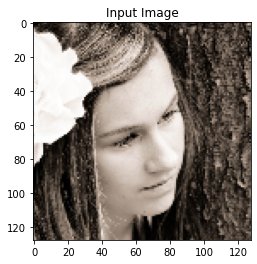

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[0.00067715]]
2 layer model


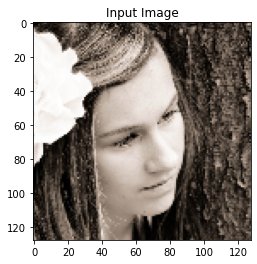

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1]]
Percentage Confidence: [[6.978874e-07]]
1 layer model


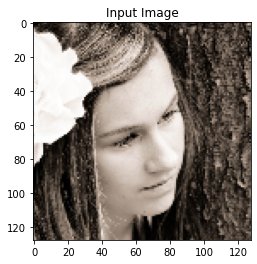

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[1.0419814e-08]]


In [33]:
img_path = 'data/validation_photoshop_dataset/photoshop_validation/fake_modified/flickr_0531.png'

dataset_name = "CelebA"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


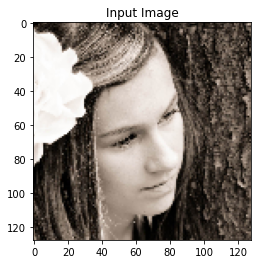

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[0.00051237]]
2 layer model


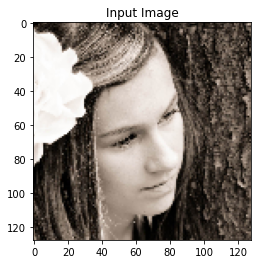

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1]]
Percentage Confidence: [[6.542261e-07]]
1 layer model


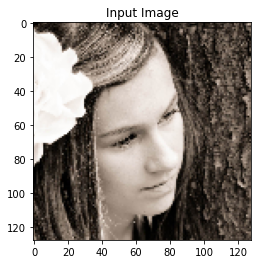

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[5.5286993e-09]]


In [34]:
img_path = 'data/validation_photoshop_dataset/photoshop_validation/real_reference/flickr_0531.png'

dataset_name = "CelebA"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


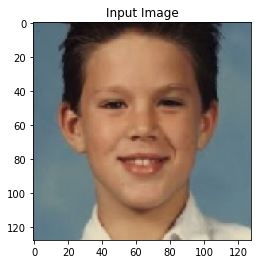

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[0.05352341]]
2 layer model


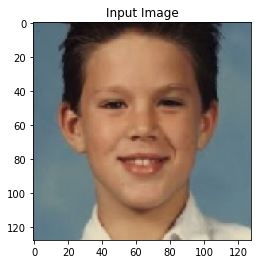

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1]]
Percentage Confidence: [[0.84968734]]
1 layer model


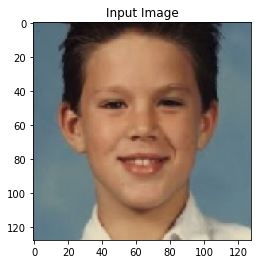

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0]]
Percentage Confidence: [[0.02418071]]


In [45]:
img_path = 'data/validation_Large_Age_Gap/LAG/0_1.png'

dataset_name = "CelebA"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


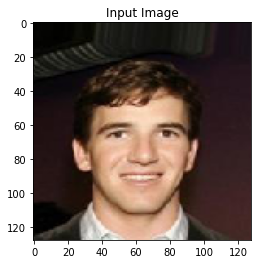

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1.]]
Percentage Confidence: [[1.]]
(1, 126, 126, 32)


/home/matthew/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning: invalid value encountered in true_divide


2 layer model


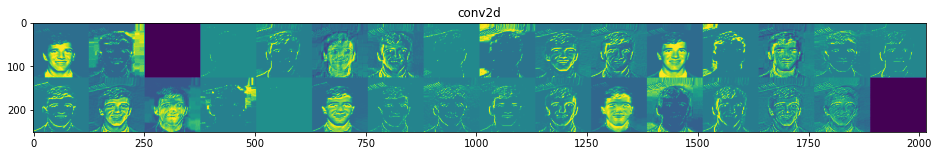

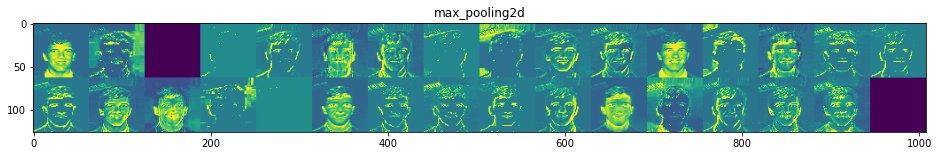

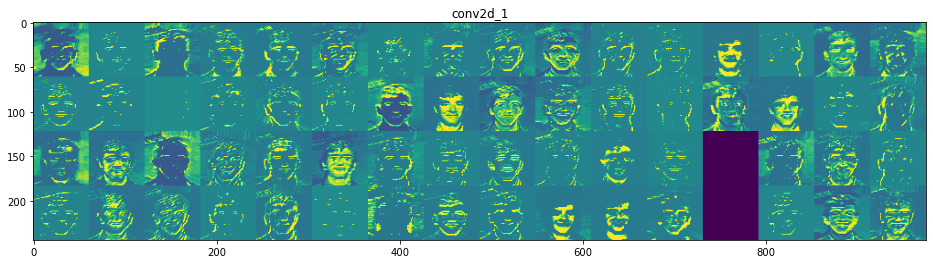

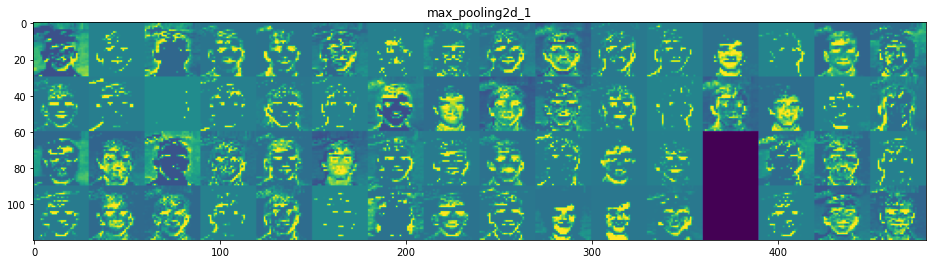

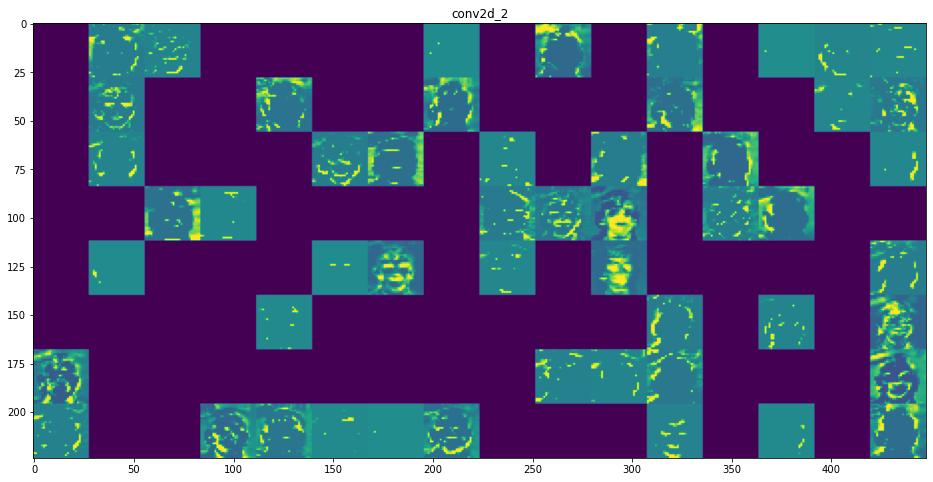

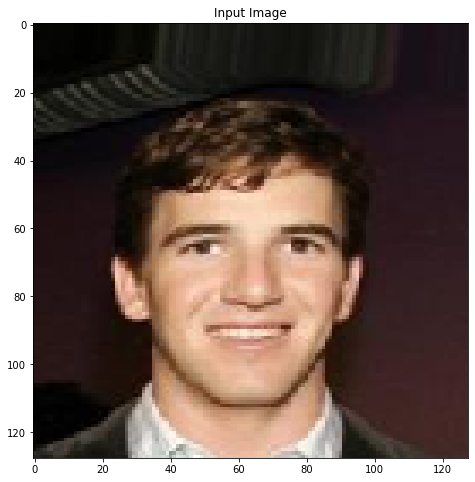

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1.]]
Percentage Confidence: [[1.]]
(1, 126, 126, 32)
1 layer model


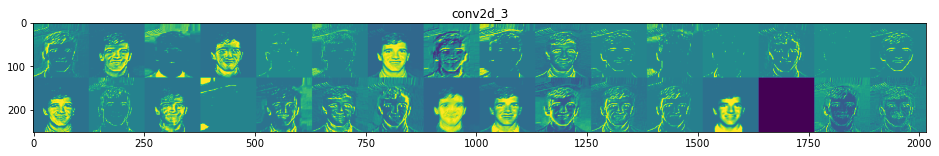

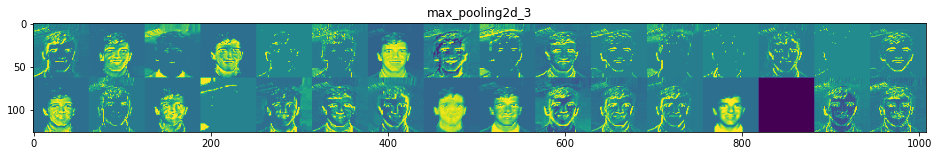

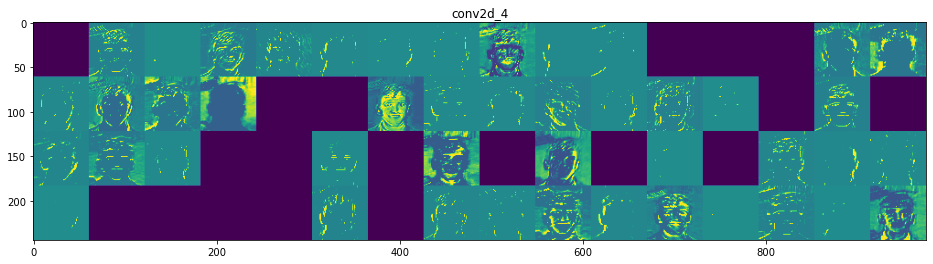

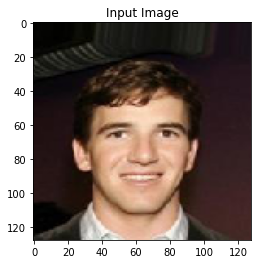

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1.]]
Percentage Confidence: [[0.9996953]]
(1, 126, 126, 32)


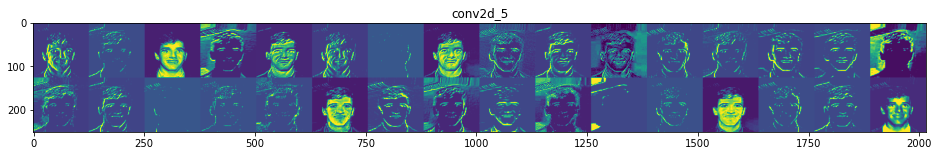

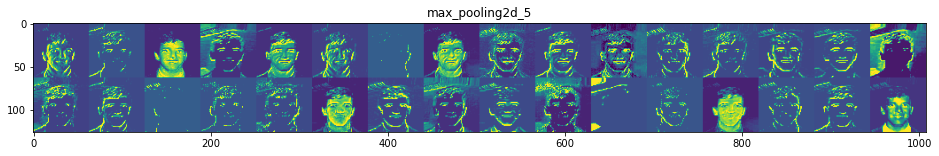

In [35]:
img_path = 'data/test/img_align_celeba/180002.jpg'

dataset_name = "CelebA"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


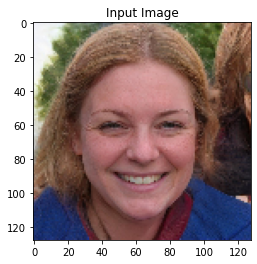

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[5.7848894e-07]]
(1, 126, 126, 32)


/home/matthew/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning: invalid value encountered in true_divide


2 layer model


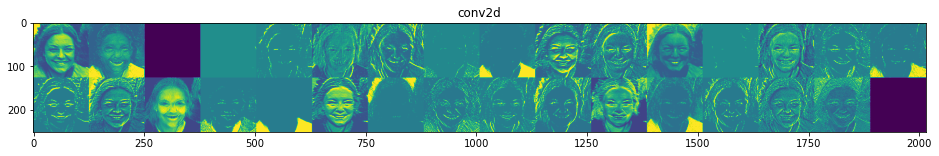

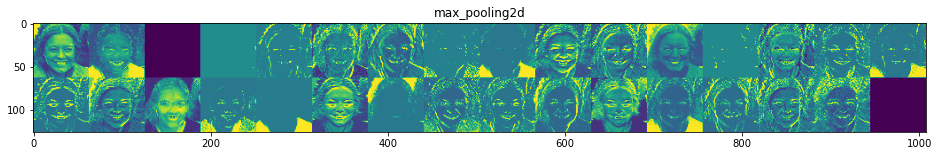

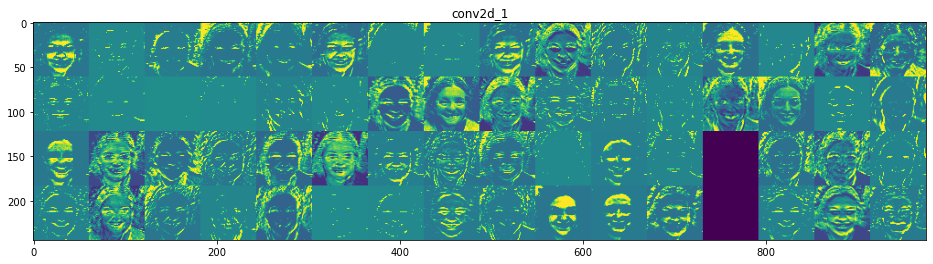

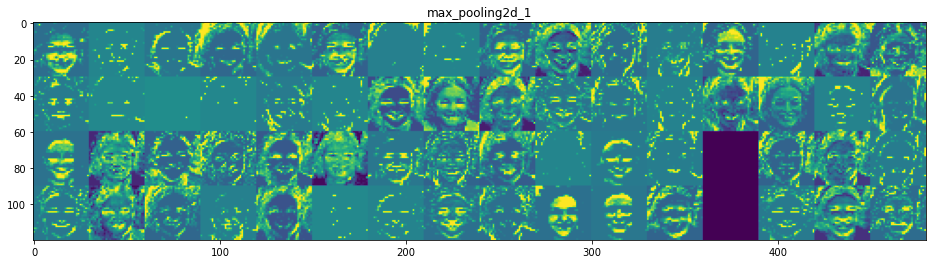

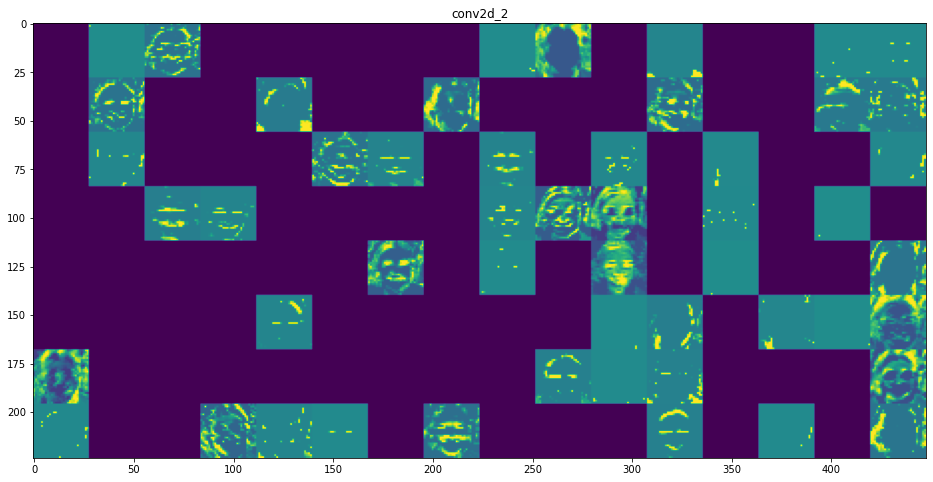

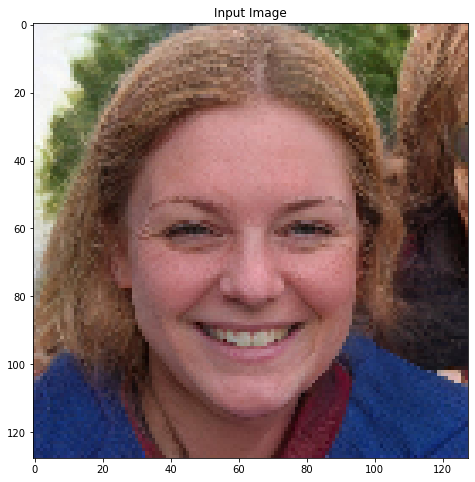

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[1.8831902e-07]]
(1, 126, 126, 32)
1 layer model


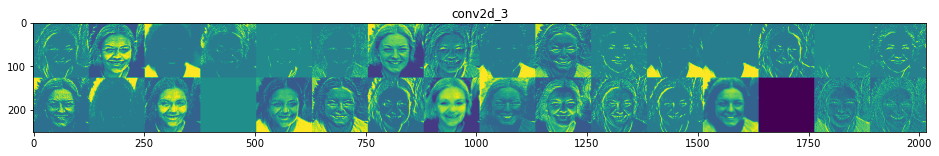

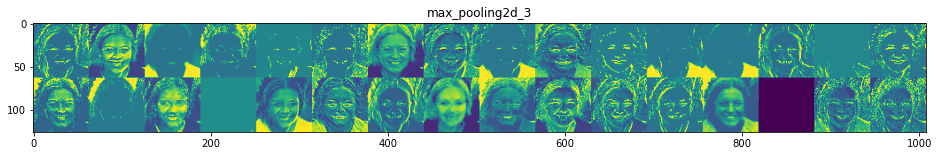

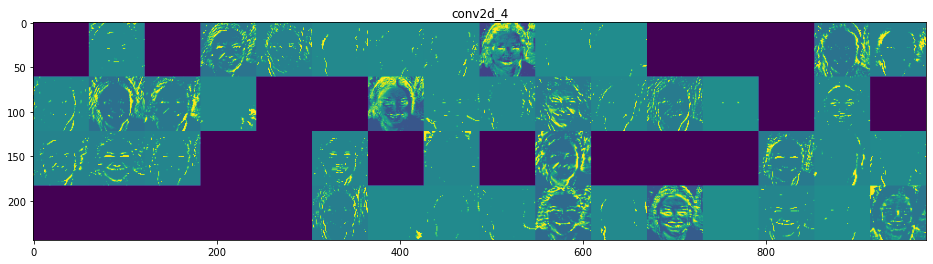

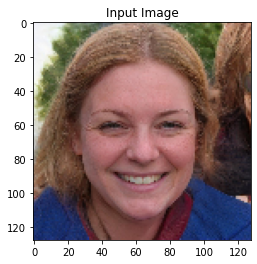

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[3.6219649e-06]]
(1, 126, 126, 32)


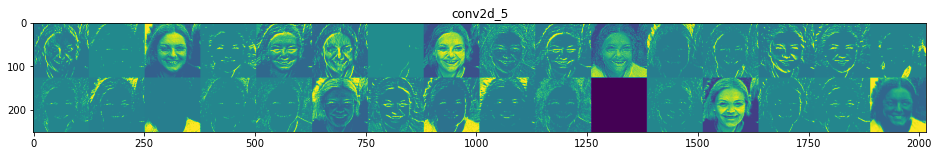

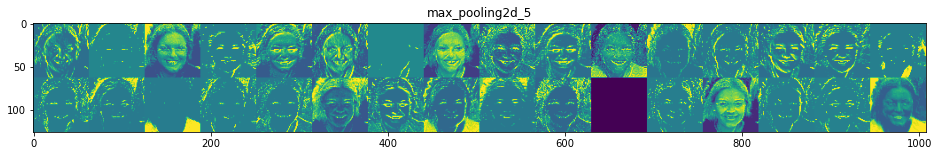

In [36]:
img_path = 'data/validation_1m_7to15/1m_faces_07/0A8QN58P6H.jpg'

dataset_name = "1m_fake"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


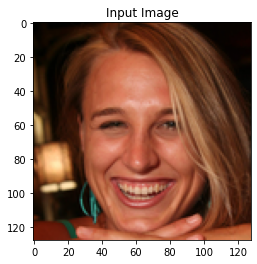

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[2.22718e-06]]
(1, 126, 126, 32)


/home/matthew/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning: invalid value encountered in true_divide


2 layer model


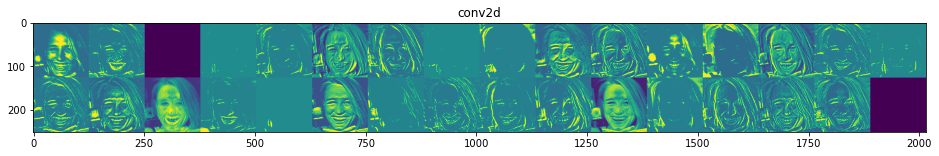

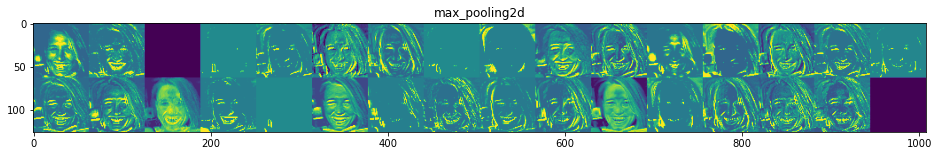

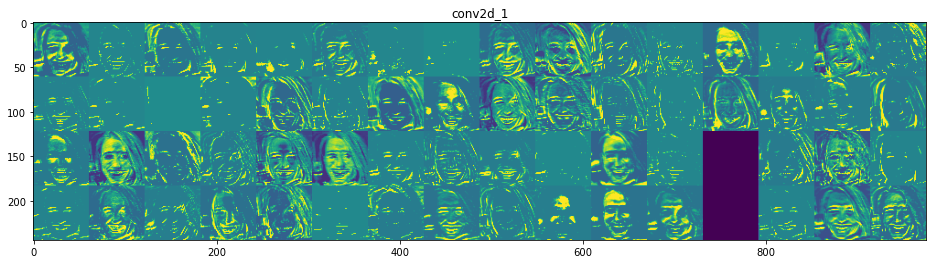

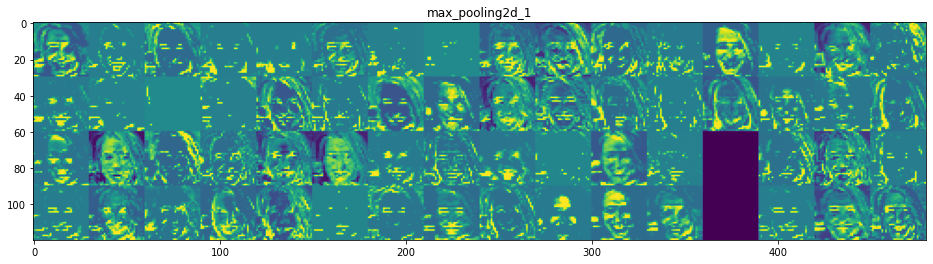

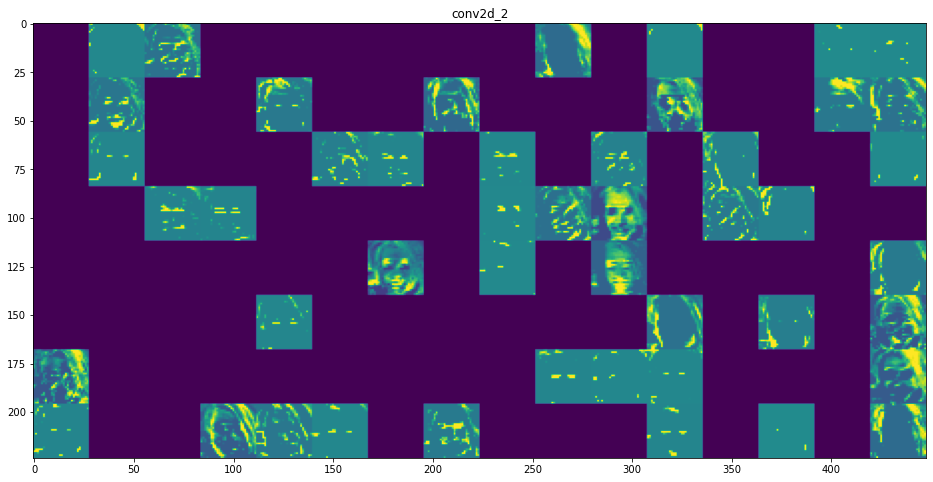

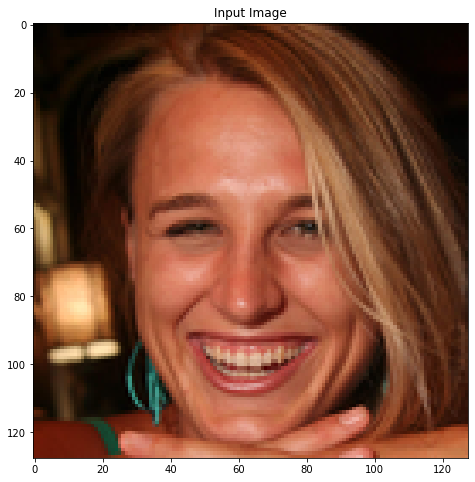

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[2.1314882e-08]]
(1, 126, 126, 32)
1 layer model


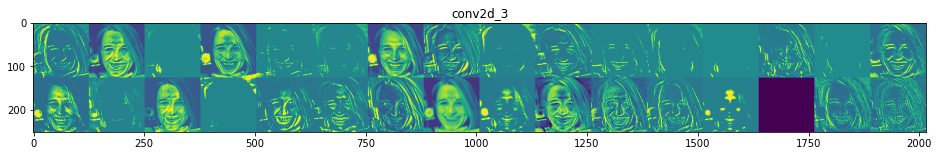

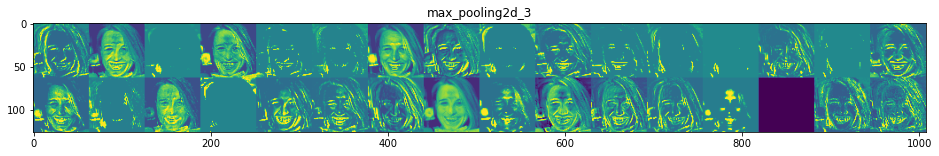

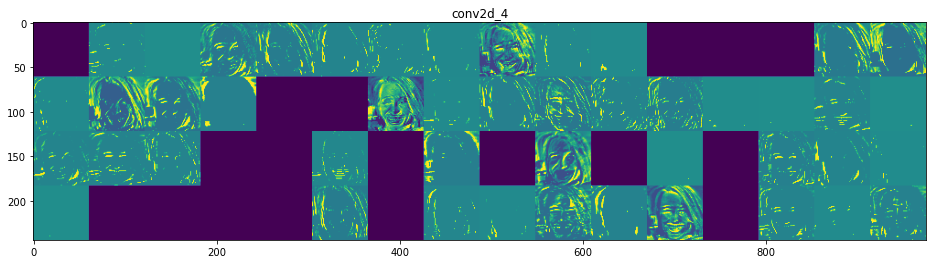

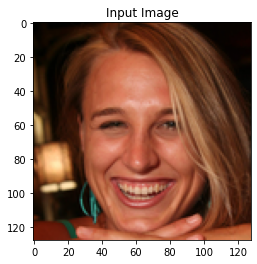

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[0.]]
Percentage Confidence: [[0.00035017]]
(1, 126, 126, 32)


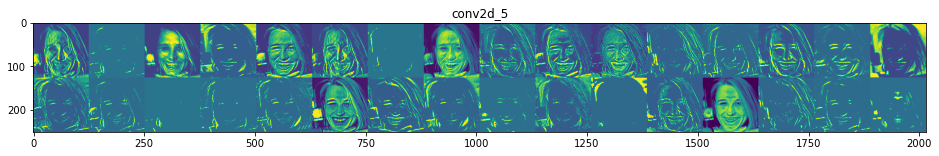

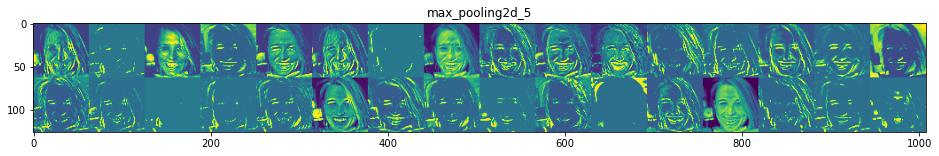

In [37]:
img_path = 'data/validation_Flickr_Faces_HQ/flickr_Faces_HQ/00001.png'

dataset_name = "Flickr"

test_all_models_layer_examination(img_path, dataset_name)

3 layer model


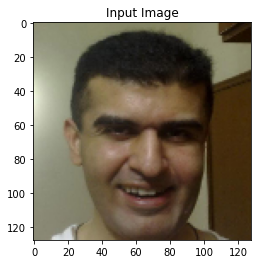

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[2.928322e-13]]
Percentage Confidence: [[0.04908759]]
(1, 126, 126, 32)


/home/matthew/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning: invalid value encountered in true_divide


2 layer model


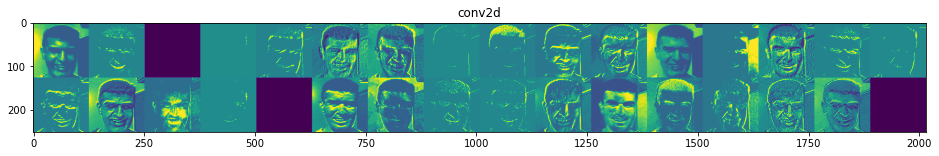

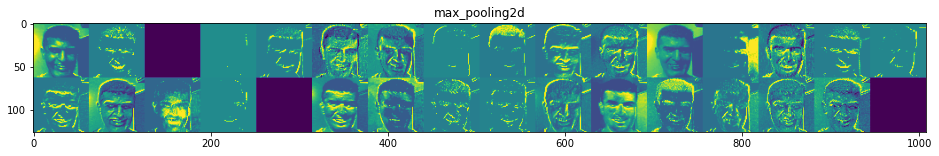

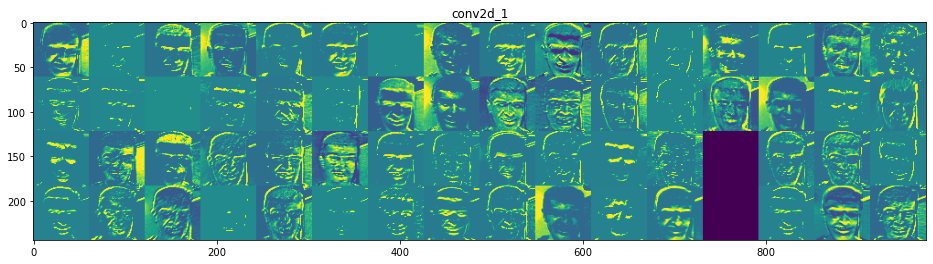

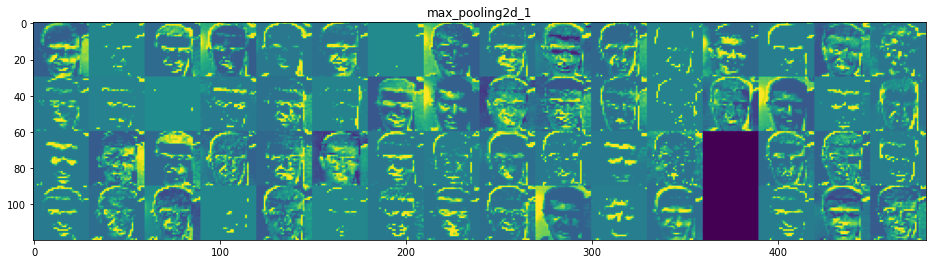

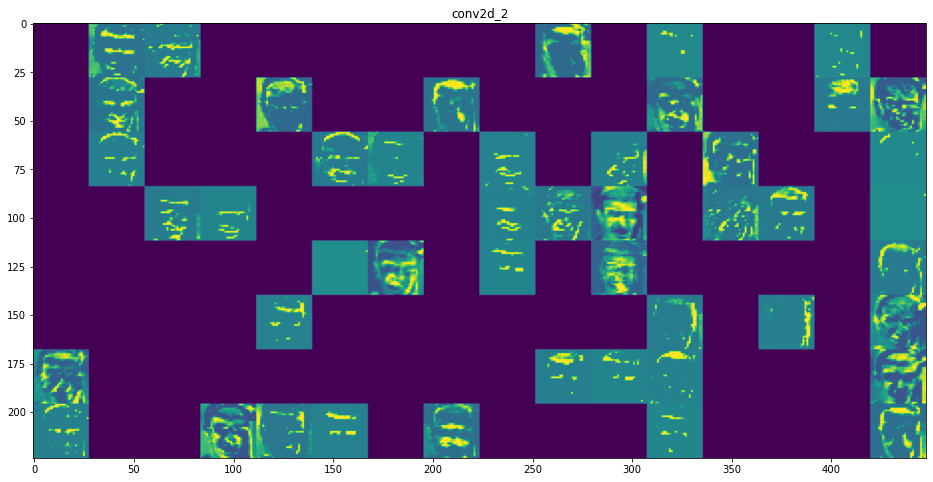

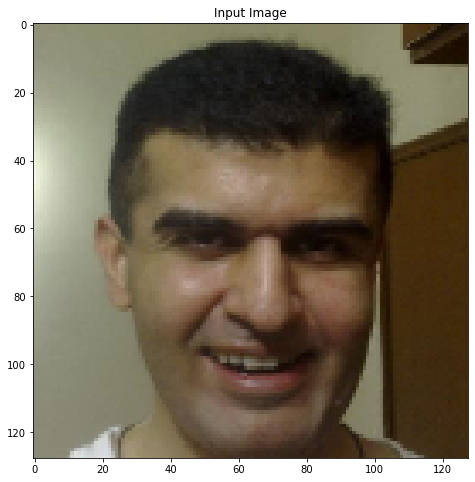

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1.]]
Percentage Confidence: [[0.01667052]]
(1, 126, 126, 32)
1 layer model


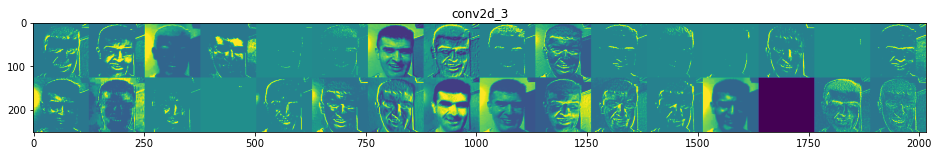

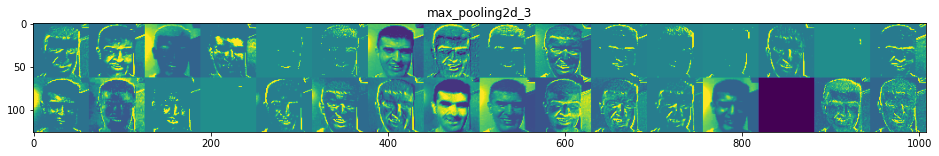

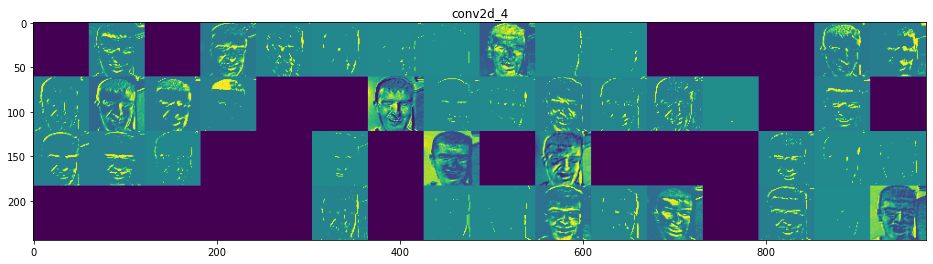

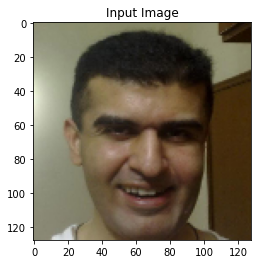

(1, 128, 128, 3)
0 is Fake, 1 is Real
Predicted class is: [[1.]]
Percentage Confidence: [[0.36384544]]
(1, 126, 126, 32)


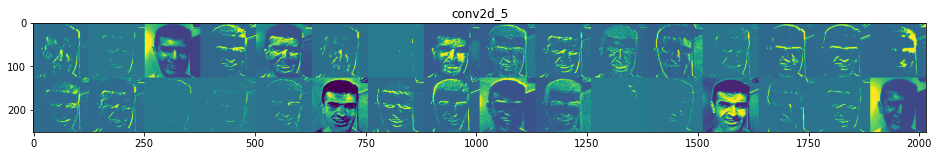

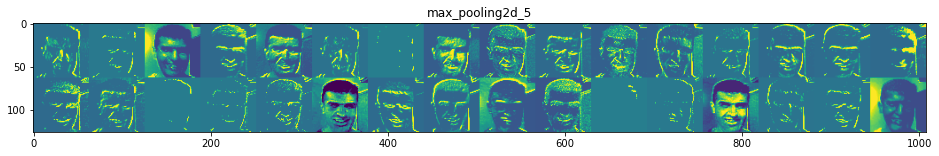

In [12]:
img_path = 'data/validation_photoshop_dataset/photoshop_validation/fake_modified/flickr_0526.png'

dataset_name = "Photoshop"

test_all_models_layer_examination(img_path, dataset_name)